<a href="https://colab.research.google.com/github/abarman123/ECE1512_2022W_ProjectRepo_Ayandev/blob/main/HMT.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
import os

drive.mount('/content/drive')
os.chdir(r'/content/drive/My Drive/ECE1512')

Mounted at /content/drive


In [2]:
import os, sys
import numpy as np
import pandas as pd
import tensorflow
import keras
from keras.preprocessing.image import ImageDataGenerator
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, GlobalAveragePooling2D, Dense, Flatten
from keras import regularizers
import keras.backend as K
from keras.models import load_model
from tensorflow.core.util import event_pb2
from tensorflow.python.lib.io import tf_record
import matplotlib.pyplot as plt
import cv2
from sklearn import metrics
from sklearn.preprocessing import label_binarize
from skimage.segmentation import mark_boundaries

In [3]:
# setup plot params
import matplotlib
matplotlib.rcParams.update({'font.size': 16})

#Part 2: Histopathological Tissue Classification

###Task 3

LOAD CNN trained model and test datasets

In [4]:
# Load HMT Test Dataset
test_dir = './hmt_dataset/HMT_test'

test_datagen = ImageDataGenerator(rescale=1/255.)

print('generating test images...')
test_generator = test_datagen.flow_from_directory(test_dir,
class_mode='categorical',
interpolation='bilinear',
target_size=(224, 224),
batch_size=496,
shuffle=False)

generating test images...
Found 496 images belonging to 8 classes.


In [5]:
# Loading  HMT trained model
model_hmt=load_model('./models/HMT.h5')
model_hmt.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 224, 224, 32)      896       
                                                                 
 conv2d_1 (Conv2D)           (None, 224, 224, 32)      9248      
                                                                 
 max_pooling2d (MaxPooling2D  (None, 112, 112, 32)     0         
 )                                                               
                                                                 
 conv2d_2 (Conv2D)           (None, 112, 112, 64)      18496     
                                                                 
 conv2d_3 (Conv2D)           (None, 112, 112, 64)      36928     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 56, 56, 64)       0         
 2D)                                                    

In [6]:
# Test images and prediction array
test_generator.reset()
img_batch,label_batch=test_generator.next()
#predict_out=model_hmt(image_batch)
prediction_out=model_hmt(img_batch)

Evaluate performance of model

In [7]:
# classification accuracy

classes=['Tumor', 'Stroma', 'Complex', 'Lympho', 'Debris', 'Mucosa', 'Adipose', 'Empty']

y_test = [np.argmax(x) for x in label_batch]
y_predict = [np.argmax(x) for x in prediction_out]


acc_score = metrics.accuracy_score(y_test, y_predict)
print('Overall Accuracy: ', acc_score)


Conf_Mat = metrics.confusion_matrix(y_test, y_predict)
class_accuracy = {}
for i in range(len(Conf_Mat)):
  class_accuracy[classes[i]] = [Conf_Mat[i][i], sum(Conf_Mat[i])-Conf_Mat[i][i], Conf_Mat[i][i]/sum(Conf_Mat[i])]

print(class_accuracy)

precision = metrics.precision_score(y_test, y_predict, average='macro')
print('Overall precision: ', precision)


recall = metrics.recall_score(y_test, y_predict, average='macro', zero_division=0)
print('Overall recall: ', recall)


F1_score = 2 * (precision * recall) / (precision + recall)
print('Overall F1_score: ', F1_score)

Overall Accuracy:  0.8346774193548387
{'Tumor': [53, 9, 0.8548387096774194], 'Stroma': [47, 15, 0.7580645161290323], 'Complex': [48, 14, 0.7741935483870968], 'Lympho': [53, 9, 0.8548387096774194], 'Debris': [41, 21, 0.6612903225806451], 'Mucosa': [51, 11, 0.8225806451612904], 'Adipose': [59, 3, 0.9516129032258065], 'Empty': [62, 0, 1.0]}
Overall precision:  0.8475563179510548
Overall recall:  0.8346774193548387
Overall F1_score:  0.8410675693120249


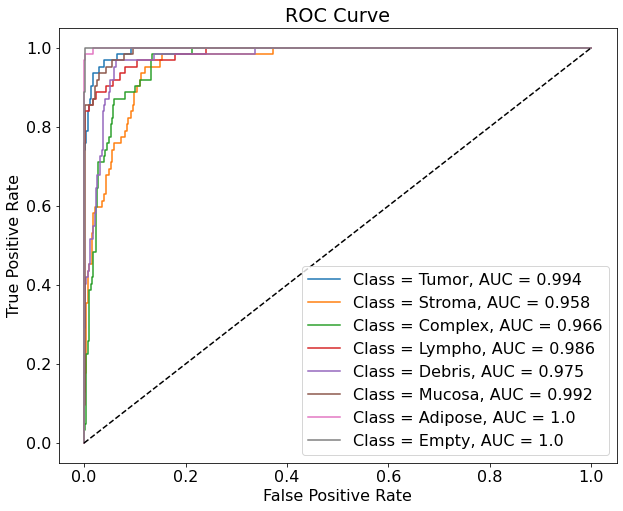

auc scores


{'Adipose': 0.9996655269808236,
 'Complex': 0.9655492790248253,
 'Debris': 0.9751003419057529,
 'Empty': 0.9997398543184183,
 'Lympho': 0.9864724245577523,
 'Mucosa': 0.9919726475397651,
 'Stroma': 0.9584881819533224,
 'Tumor': 0.9944626133491898}

In [ ]:
# roc curves and auc scores by class

y_test_binary = label_binarize(y_test, classes=range(len(classes)))
auc = {}

fig1 = plt.figure(figsize=(10,8))
for i in range(len(classes)):
  false_positive_rate, total_positive_rate, threshold = metrics.roc_curve(y_test_binary[:,i], prediction_out[:,i])
  auc[classes[i]] = metrics.roc_auc_score(y_test_binary[:,i], prediction_out[:,i])
  plt.plot(false_positive_rate, total_positive_rate, label = 'Class = {}, AUC = {}'.format(classes[i], np.round(metrics.roc_auc_score(y_test_binary[:,i], prediction_out[:,i]),3)))

plt.plot([0, 1], [0, 1], color='black', linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend()
plt.show()
fig1.savefig('roc_hmt.png', bbox_inches='tight')

print('auc scores')
auc

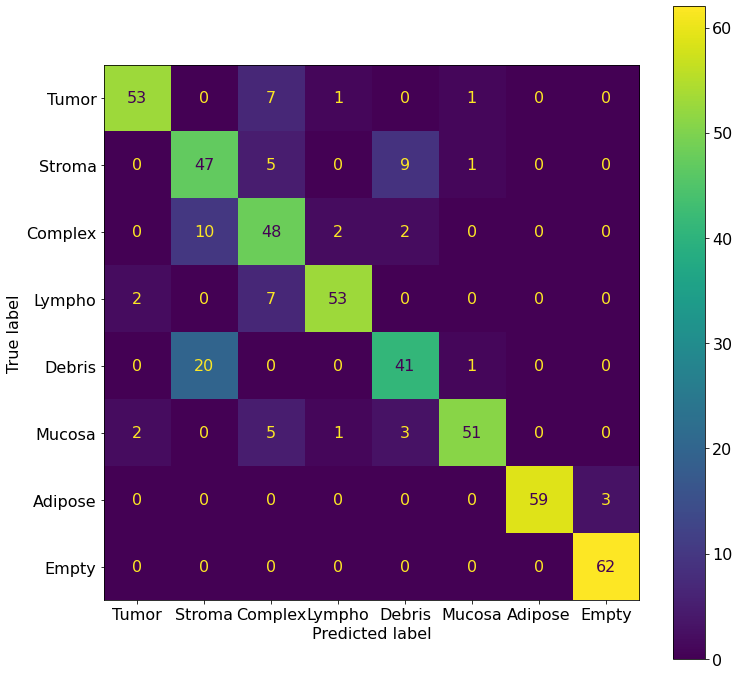

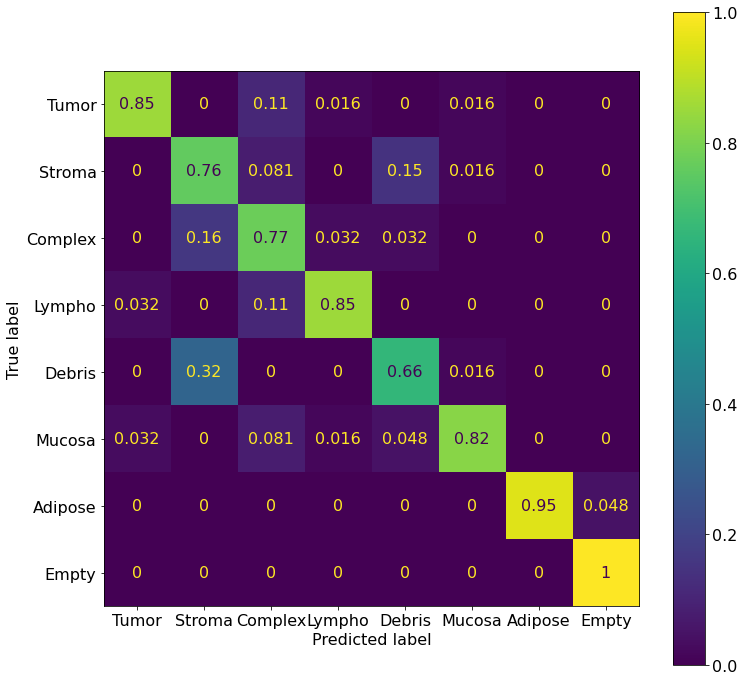

In [ ]:
# confusion matrix

fig1 = plt.figure(figsize=(12,12))
ax1 = plt.axes()
disp = metrics.ConfusionMatrixDisplay(confusion_matrix=Conf_Mat, display_labels=classes)
disp.plot(ax=ax1)
fig1.savefig('cm_hmt.png', bbox_inches='tight')

# normalized
normalised_ConfMatrix = np.array([line/sum(line) for line in Conf_Mat])

fig2 = plt.figure(figsize=(12,12))
ax2 = plt.axes()
disp_norm = metrics.ConfusionMatrixDisplay(confusion_matrix=normalised_ConfMatrix, display_labels=classes)
disp_norm.plot(ax=ax2)
fig2.savefig('cm_hmt_norm.png', bbox_inches='tight')

20
Debris images classified as Stroma


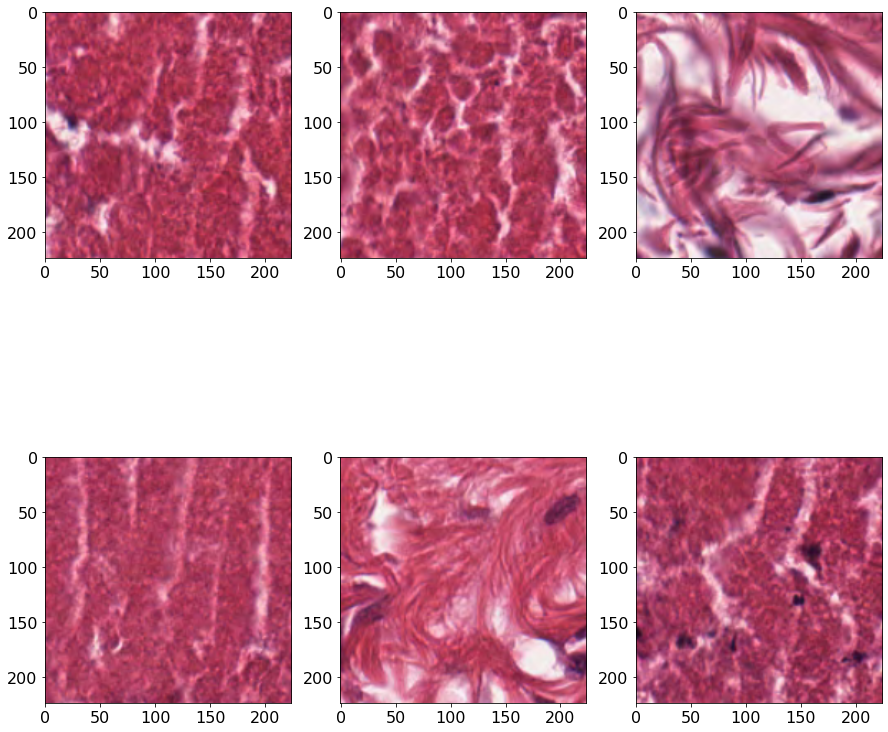

In [ ]:
# Confusion matrix shows: 15% of Actual Debris images are detected as Stroma class, moreover 32% of Stroma images are detected as Debris class - 20 images

#index_label_debris = classes.index('Debris')
#index_label_stroma = classes.index('Stroma')

class_debris = classes.index('Debris')
class_stroma = classes.index('Stroma')

# Select images which actually belong to Debris class but detected as Stroma
img_debris_stroma = [img_batch[i] for i in range(len(img_batch)) if y_test[i] == class_debris and y_predict[i] == class_stroma]
print(len(img_debris_stroma))
print('Debris images classified as Stroma')
fig1 = plt.figure(figsize=(15,15))

#for i in range(6):
#  plt.subplot(2,3,i+1)
for i in range(7,13):
  plt.subplot(2,3,i-6)
  plt.imshow(img_debris_stroma[i])

fig1.savefig('hmt_debris_as_stroma.png', bbox_inches='tight')


Stroma images classified as Stroma


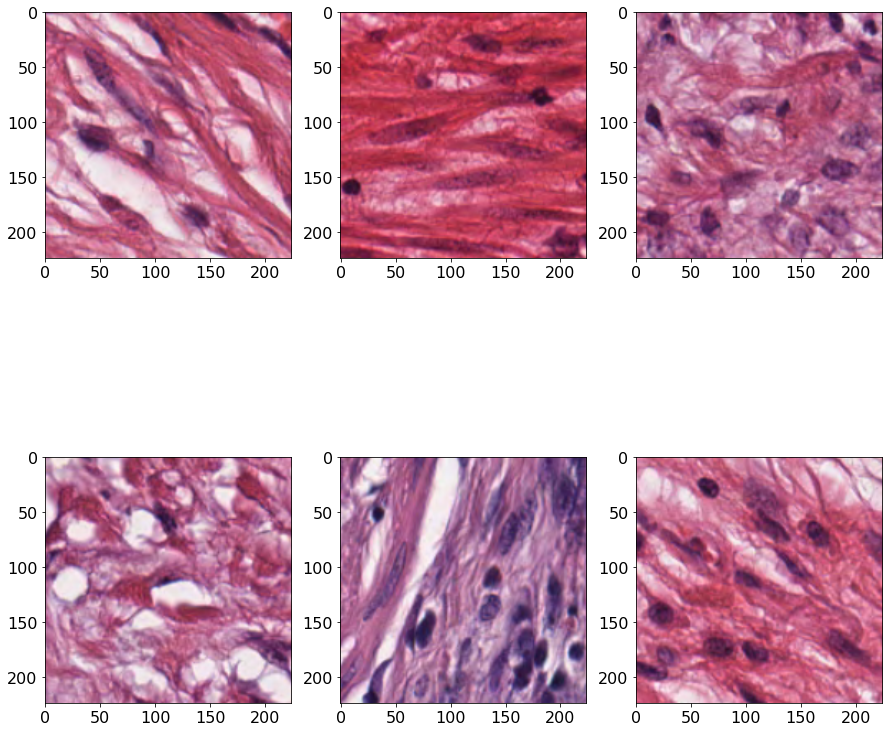

In [ ]:
# Images detected as Stroma, which actually belongs to Stroma class 76% - 47 such images
img_stroma_stroma = [img_batch[i] for i in range(len(img_batch)) if y_test[i] == class_stroma and y_predict[i] == class_stroma]

print('Stroma images classified as Stroma')
fig1 = plt.figure(figsize=(15,15))

#for i in range(6):
 # plt.subplot(2,3,i+1)
for i in range(7,13):
  plt.subplot(2,3,i-6)
  plt.imshow(img_stroma_stroma[i])

fig1.savefig('hmt_stroma_as_stroma.png', bbox_inches='tight')

Debris images classified as Debris


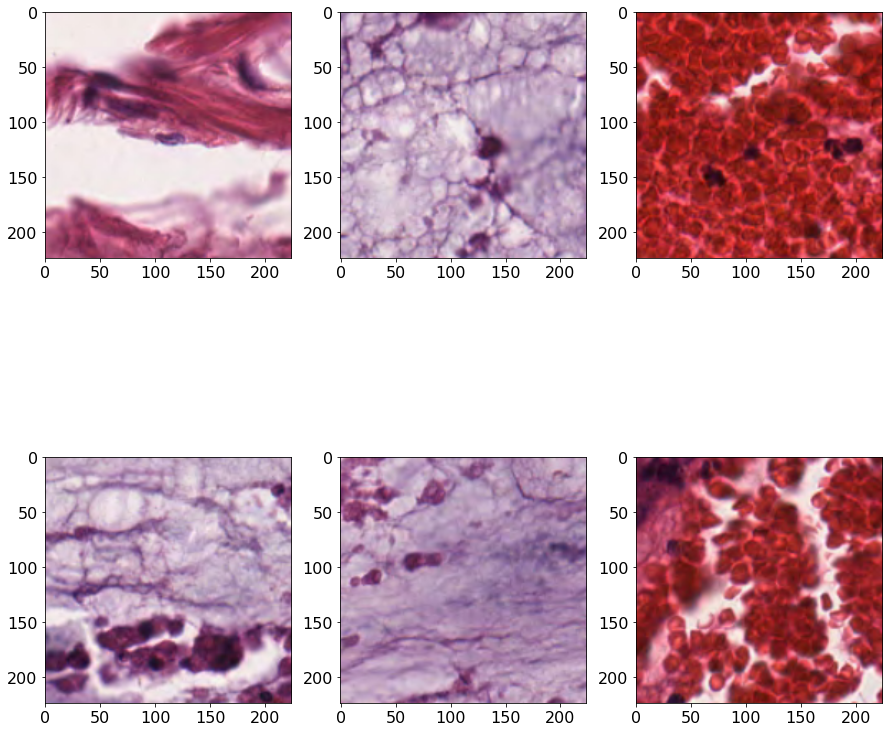

In [ ]:
# Images detected as Debris, which actually belongs to Debris class 66% - 41 such images
img_debris_debris = [img_batch[i] for i in range(len(img_batch)) if y_test[i] == class_debris and y_predict[i] == class_debris]

print('Debris images classified as Debris')
fig1 = plt.figure(figsize=(15,15))

#for i in range(6):
for i in range(7,13):
  plt.subplot(2,3,i-6)
  plt.imshow(img_debris_debris[i])

fig1.savefig('hmt_debris_as_debris.png', bbox_inches='tight')

Stroma images classified as Debris


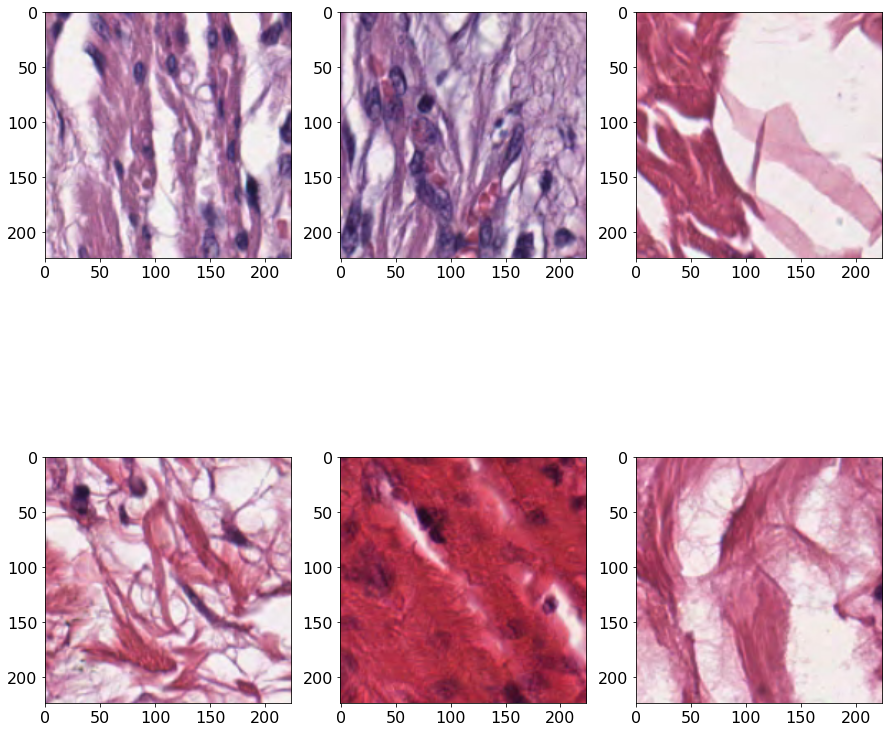

In [ ]:
# Select images which actually belong to Stroma class but detected as Debris - 9 such images
img_stroma_debris = [img_batch[i] for i in range(len(img_batch)) if y_test[i] == class_stroma and y_predict[i] == class_debris]

print('Stroma images classified as Debris')
fig1 = plt.figure(figsize=(15,15))

#for i in range(6):
#  plt.subplot(2,3,i+1)
#for i in range(7,13):  --------> IndexError: list index out of range, so this range needs to be changed
for i in range(2,8):
  plt.subplot(2,3,i-1)
  plt.imshow(img_stroma_debris[i])

fig1.savefig('hmt_stroma_as_debris.png', bbox_inches='tight')

#Grad-CAM

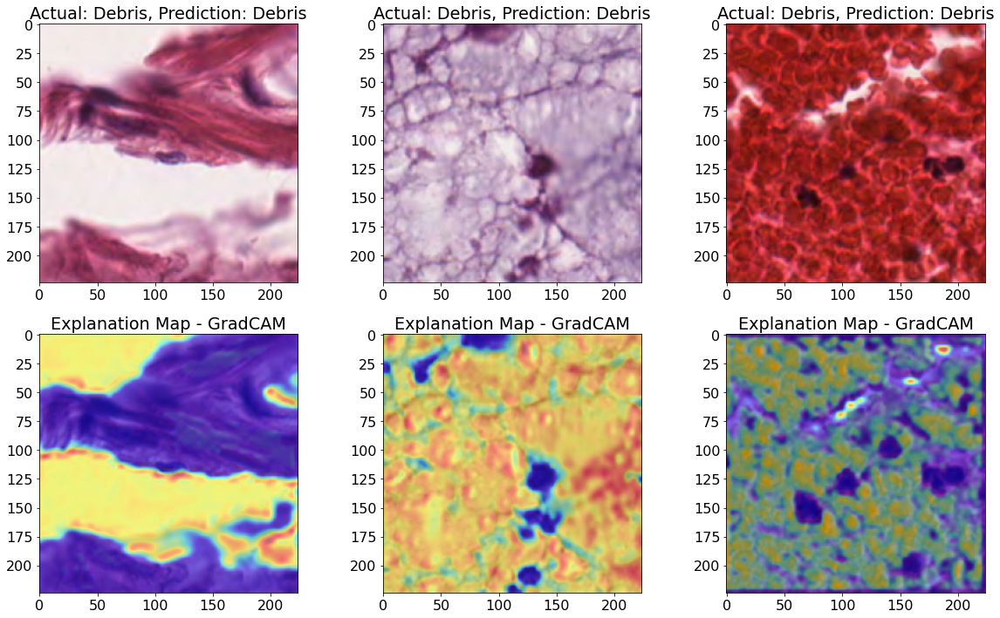

In [ ]:
# Explanation MAP for : Actual Debris image detected as Debris
from xai_utils import grad_cam

map_GradCAM = []

#for i in range(3):
for i in range(7,10):
  map_GradCAM.append(grad_cam(model_hmt, np.expand_dims(img_debris_debris[i], axis=0), 'max_pooling2d_1'))
  map_GradCAM[i-7] = np.array(map_GradCAM[i-7])
  map_GradCAM[i-7] -= map_GradCAM[i-7].min()
  map_GradCAM[i-7] /= map_GradCAM[i-7].max()+10e-30

fig1 = plt.figure(figsize=(20,12))

#for i in range(3):
  #plt.subplot(2,3,i+1)
for i in range(7,10):
  plt.subplot(2,3,i-6)
  plt.imshow(img_debris_debris[i])
  plt.title('Actual: Debris, Prediction: Debris')
  

#for i in range(3,6):
  #plt.subplot(2,3,i+1)
for i in range(7,10):
  plt.subplot(2,3,i-3)
  plt.imshow(img_debris_debris[i])
  #plt.imshow(map_GradCAM[i-3], cmap='jet', alpha=0.5)
  plt.imshow(map_GradCAM[i-7], cmap='jet', alpha=0.5)
  plt.title('Explanation Map - GradCAM')

fig1.savefig('hmt_debris_as_debris_gradcam.png', bbox_inches='tight')

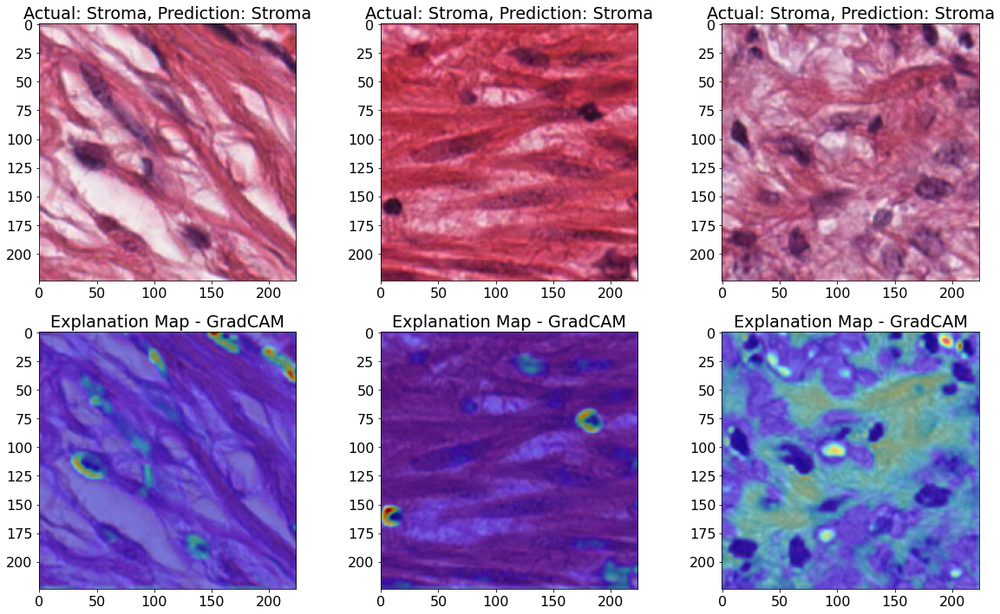

In [ ]:
# Explanation MAP for : Actual stroma image detected as Stroma
from xai_utils import grad_cam

map_GradCAM = []

#for i in range(3):
for i in range(7,10):
  map_GradCAM.append(grad_cam(model_hmt, np.expand_dims(img_stroma_stroma[i], axis=0), 'max_pooling2d_1'))
  map_GradCAM[i-7] = np.array(map_GradCAM[i-7])
  map_GradCAM[i-7] -= map_GradCAM[i-7].min()
  map_GradCAM[i-7] /= map_GradCAM[i-7].max()+10e-30

fig1 = plt.figure(figsize=(20,12))

#for i in range(3):
#  plt.subplot(2,3,i+1)
for i in range(7,10):
  plt.subplot(2,3,i-6)
  plt.imshow(img_stroma_stroma[i])
  plt.title('Actual: Stroma, Prediction: Stroma')

#for i in range(3,6):
#  plt.subplot(2,3,i+1)
for i in range(7,10):
  plt.subplot(2,3,i-3)
  plt.imshow(img_stroma_stroma[i])
  plt.imshow((map_GradCAM[i-7]), cmap='jet', alpha=0.5)
  #plt.imshow(cv2.cvtColor(superimpose(image_stroma_stroma[i-3], map_GradCAM[i-3], 0.5, emphasize=False), cv2.COLOR_BGR2RGB))
  plt.title('Explanation Map - GradCAM')
  

fig1.savefig('hmt_stroma_as_stroma_gradcam.png', bbox_inches='tight')

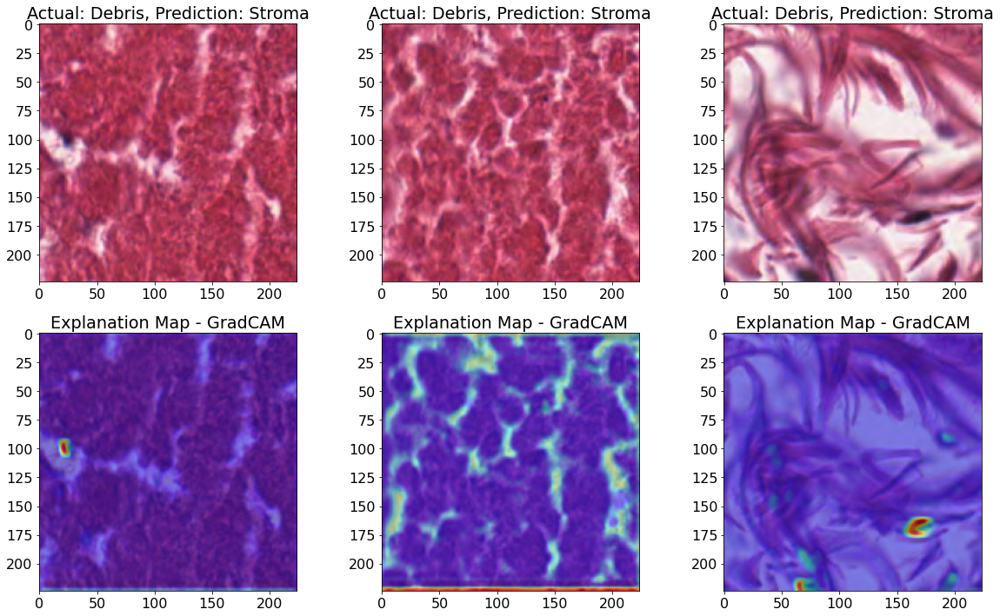

In [ ]:
7# Explanation MAP for : Actual debris image but detected as Stroma
from xai_utils import grad_cam

map_GradCAM = []

#for i in range(3):
for i in range(7,10):
  map_GradCAM.append(grad_cam(model_hmt, np.expand_dims(img_debris_stroma[i], axis=0), 'max_pooling2d_1'))
  map_GradCAM[i-7] = np.array(map_GradCAM[i-7])
  map_GradCAM[i-7] -= map_GradCAM[i-7].min()
  map_GradCAM[i-7] /= map_GradCAM[i-7].max()+10e-30

fig1 = plt.figure(figsize=(20,12))

#for i in range(3):
#  plt.subplot(2,3,i+1)
for i in range(7,10):
  plt.subplot(2,3,i-6)
  plt.imshow(img_debris_stroma[i])
  plt.title('Actual: Debris, Prediction: Stroma')

#for i in range(3,6):
#  plt.subplot(2,3,i+1)
for i in range(7,10):
  plt.subplot(2,3,i-3)
  plt.imshow(img_debris_stroma[i])
  plt.imshow(map_GradCAM[i-7], cmap='jet', alpha=0.5)
  plt.title('Explanation Map - GradCAM')

fig1.savefig('hmt_debris_as_stroma_gradcam.png', bbox_inches='tight')

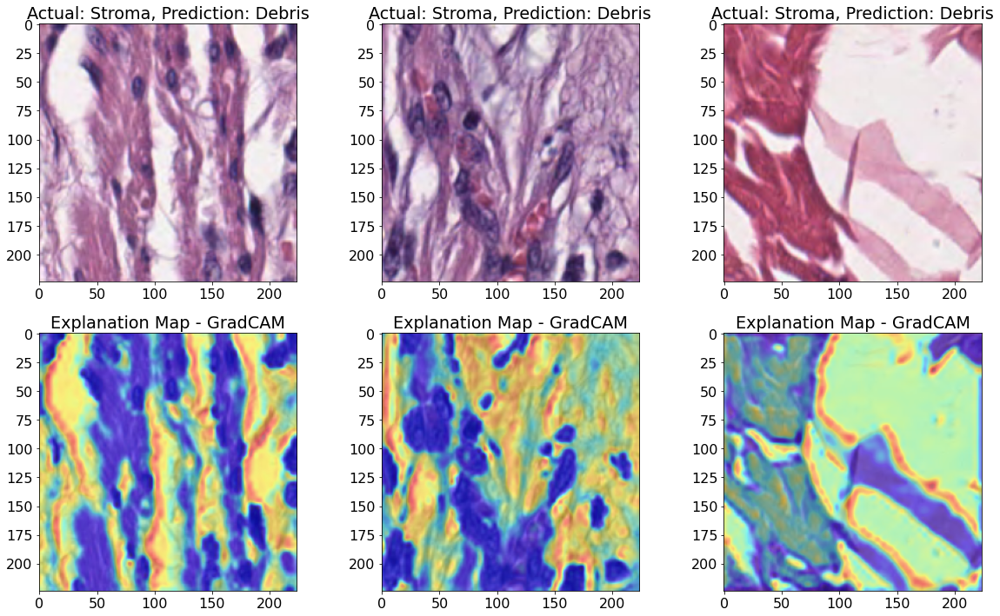

In [ ]:
# Explanation MAP for : Actual Stroma image but detected as Debris
from xai_utils import grad_cam

map_GradCAM = []

for i in range(2,5):
  map_GradCAM.append(grad_cam(model_hmt, np.expand_dims(img_stroma_debris[i], axis=0), 'max_pooling2d_1'))
  map_GradCAM[i-2] = np.array(map_GradCAM[i-2])
  map_GradCAM[i-2] -= map_GradCAM[i-2].min()
  map_GradCAM[i-2] /= map_GradCAM[i-2].max()+10e-30

fig1 = plt.figure(figsize=(20,12))

#for i in range(3):
#  plt.subplot(2,3,i+1)
for i in range(2,5):
  plt.subplot(2,3,i-1)
  plt.imshow(img_stroma_debris[i])
  plt.title('Actual: Stroma, Prediction: Debris')


#for i in range(7,13):--> IndexError: list index out of range, so this range needs to be changed, so changed it to range(2,8)
#for i in range(3,6):
 # plt.subplot(2,3,i+1)
for i in range(2,5):
  plt.subplot(2,3,i+2)
  plt.imshow(img_stroma_debris[i])
  plt.imshow(map_GradCAM[i-2], cmap='jet', alpha=0.5)
  plt.title('Explanation Map - GradCAM')

fig1.savefig('hmt_stroma_as_debris_gradcam.png', bbox_inches='tight')

#SHAP

In [12]:
!pip install shap

     |████████████████████████████████| 564 kB 5.2 MB/s 


In [ ]:
#%%time
%load_ext autoreload
%autoreload 2

import shap






The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [ ]:
explainer_d_d = shap.GradientExplainer(model_hmt, [img_batch])
map_shap_debris_debris = explainer_d_d.shap_values(np.array(img_debris_debris[0:3]), 50)

`tf.keras.backend.set_learning_phase` is deprecated and will be removed after 2020-10-11. To update it, simply pass a True/False value to the `training` argument of the `__call__` method of your layer or model.


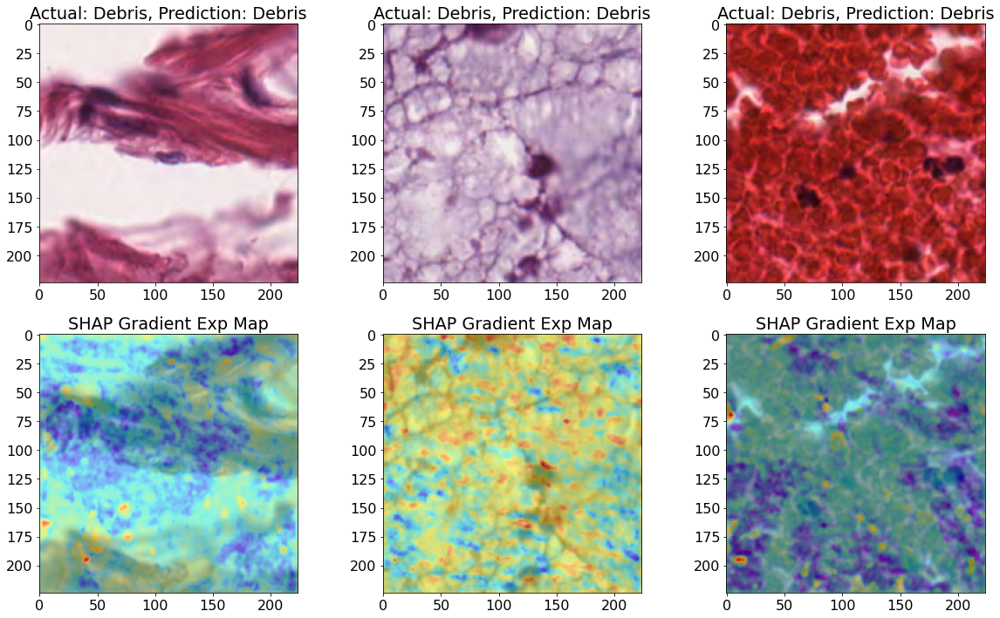

In [ ]:
map_d_d = map_shap_debris_debris[0]

img_d_d = []
#for i in range(len(map_d_d)):
for i in range(7,10):
  
  img_d_d.append(map_d_d[i-7][:,:,0])
  img_d_d[i-7] -= img_d_d[i-7].min()
  img_d_d[i-7] /= img_d_d[i-7].max()+10e-30

image_shap_debris_debris = img_d_d

#plt.imshow(img[0], cmap='jet')

# # Explanation MAP for : Actual Debris image detected as Debris

fig1 = plt.figure(figsize=(20,12))

for i in range(7,10):
  plt.subplot(2,3,i-6)
  plt.imshow(img_debris_debris[i])
  plt.title('Actual: Debris, Prediction: Debris')

for i in range(7,10):
  plt.subplot(2,3,i-3)
  plt.imshow(img_debris_debris[i])
  plt.imshow(img_d_d[i-7], cmap='jet', alpha=0.5)
  plt.title('SHAP Gradient Exp Map')

fig1.savefig('hmt_debris_as_debris_shap.png', bbox_inches='tight')

In [ ]:
%%time
import shap

explainer_s_s = shap.GradientExplainer(model_hmt, [img_batch])
map_shap_stroma = explainer_s_s.shap_values(np.array(img_stroma_stroma[0:3]), 50)

map_shap_stroma_stroma = map_shap_stroma[0]

`tf.keras.backend.set_learning_phase` is deprecated and will be removed after 2020-10-11. To update it, simply pass a True/False value to the `training` argument of the `__call__` method of your layer or model.


CPU times: user 4min 29s, sys: 9.56 s, total: 4min 38s
Wall time: 2min 46s


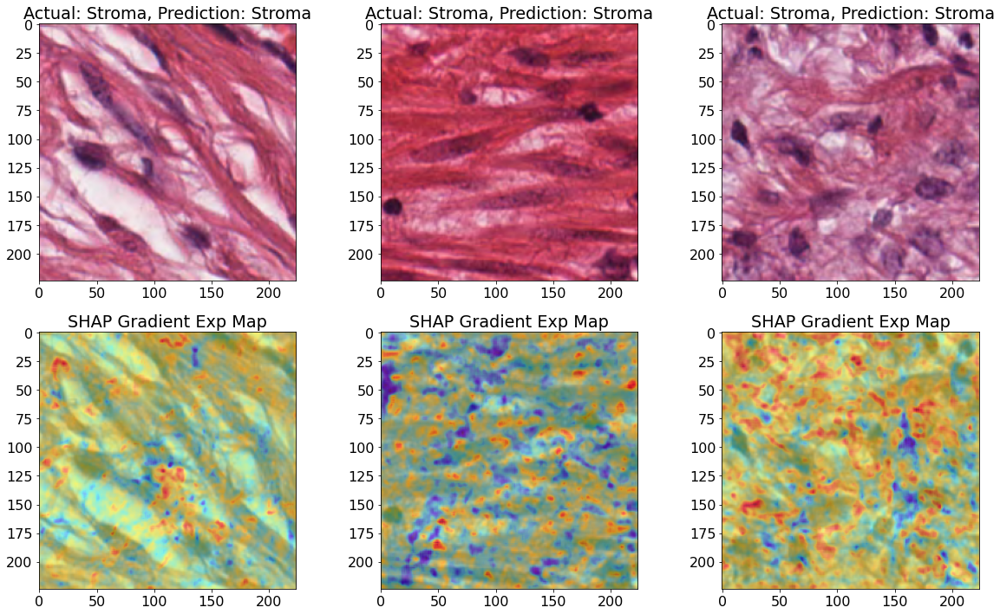

In [ ]:
# # Explanation MAP for : Actual Stroma image detected as Stroma

map_s_s= map_shap_stroma_stroma

img_s_s = []
for i in range(7,10):
  img_s_s.append(map_s_s[i-7][:,:,0])
  img_s_s[i-7] -= img_s_s[i-7].min()
  img_s_s[i-7] /= img_s_s[i-7].max()+10e-30

fig1 = plt.figure(figsize=(20,12))

for i in range(7,10):
  plt.subplot(2,3,i-6)
  plt.imshow(img_stroma_stroma[i])
  plt.title('Actual: Stroma, Prediction: Stroma')

for i in range(7,10):
  plt.subplot(2,3,i-3)
  plt.imshow(img_stroma_stroma[i])
  plt.imshow(img_s_s[i-7], cmap='jet', alpha=0.5)
  plt.title('SHAP Gradient Exp Map')

fig1.savefig('hmt_stroma_as_stroma_shap.png', bbox_inches='tight')

In [ ]:
%%time
import shap

explainer_d_s= shap.GradientExplainer(model_hmt, [img_batch])
map_shap_debris_stroma = explainer_d_s.shap_values(np.array(img_debris_stroma[0:3]), 50)

map_shap_debris_stroma = map_shap_debris_stroma[0]

`tf.keras.backend.set_learning_phase` is deprecated and will be removed after 2020-10-11. To update it, simply pass a True/False value to the `training` argument of the `__call__` method of your layer or model.


CPU times: user 4min 29s, sys: 10.7 s, total: 4min 40s
Wall time: 2min 46s


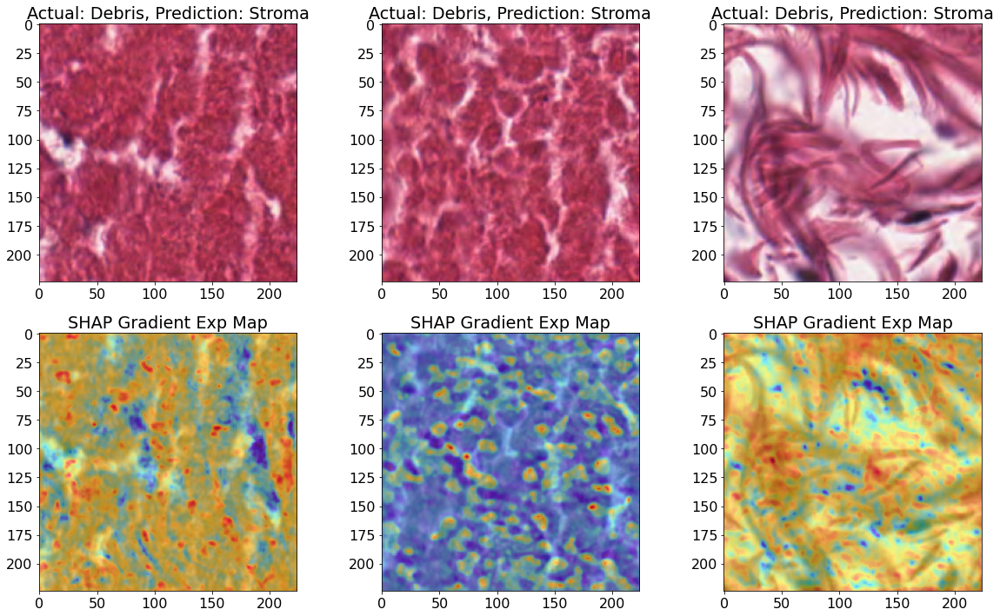

In [ ]:
# generate shap explanation maps for Debris as Stroma

map_d_s = map_shap_debris_stroma

img_d_s = []
for i in range(7,10):
  img_d_s.append(map_d_s[i-7][:,:,0])
  img_d_s[i-7] -= img_d_s[i-7].min()
  img_d_s[i-7] /= img_d_s[i-7].max()+10e-30

fig1 = plt.figure(figsize=(20,12))

for i in range(7,10):
  plt.subplot(2,3,i-6)
  plt.imshow(img_debris_stroma[i])
  plt.title('Actual: Debris, Prediction: Stroma')

for i in range(7,10):
  plt.subplot(2,3,i-3)
  plt.imshow(img_debris_stroma[i])
  plt.imshow(img_d_s[i-7], cmap='jet', alpha=0.5)
  plt.title('SHAP Gradient Exp Map')

fig1.savefig('hmt_debris_as_stroma_shap.png', bbox_inches='tight')

In [ ]:
%%time
import shap

explainer_s_d = shap.GradientExplainer(model_hmt, [img_batch])
map_shap_stroma_debris = explainer_s_d.shap_values(np.array(img_stroma_debris[0:3]), 50)

map_shap_stroma_debris = map_shap_stroma_debris[0]

`tf.keras.backend.set_learning_phase` is deprecated and will be removed after 2020-10-11. To update it, simply pass a True/False value to the `training` argument of the `__call__` method of your layer or model.


CPU times: user 4min 29s, sys: 11.5 s, total: 4min 40s
Wall time: 2min 47s


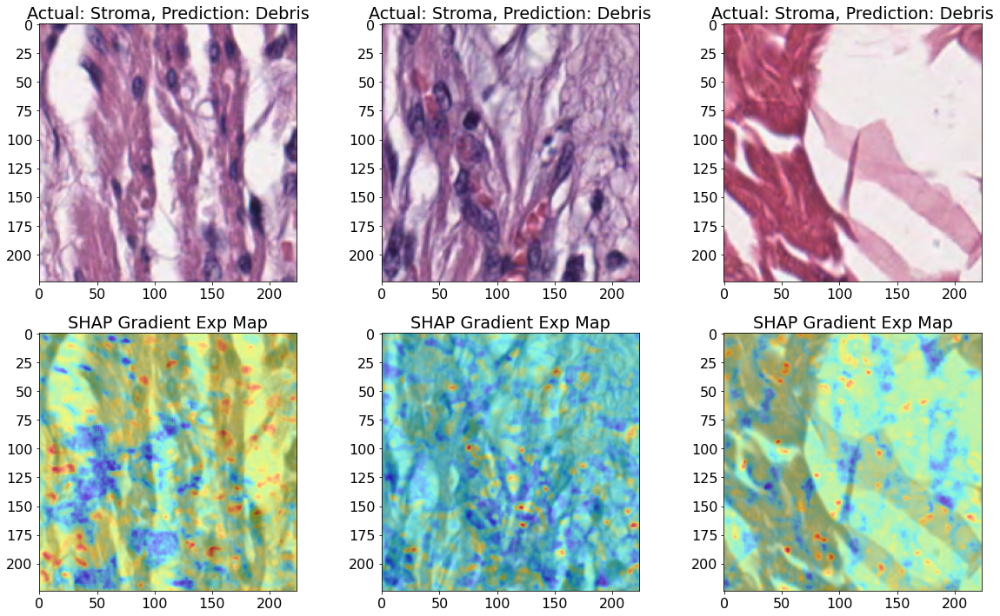

In [ ]:
# generate shap explanation maps for Stroma as Debris

map_s_d = map_shap_stroma_debris

img_s_d = []
for i in range(2,5):
  img_s_d.append(map_s_d[i-2][:,:,0])
  img_s_d[i-2] -= img_s_d[i-2].min()
  img_s_d[i-2] /= img_s_d[i-2].max()+10e-30

fig1 = plt.figure(figsize=(20,12))

for i in range(2,5):
  plt.subplot(2,3,i-1)
  plt.imshow(img_stroma_debris[i])
  plt.title('Actual: Stroma, Prediction: Debris')

for i in range(2,5):
  plt.subplot(2,3,i+2)
  plt.imshow(img_stroma_debris[i])
  plt.imshow(img_s_d[i-2], cmap='jet', alpha=0.5)
  plt.title('SHAP Gradient Exp Map')

fig1.savefig('hmt_stroma_as_debris_shap.png', bbox_inches='tight')

###Task 4

In [8]:
# apply drop% and increase% metrics to evaluate the performance of selected attribution method

# HMT: k = 90%
# calculate average drop% and increase% on the whole test set

from xai_utils import img_to_array

def calculate_drop_increase(images, model, exmap, class_index, frac=0.15):
    '''
    inputs:
        images: a 4-D image of size (1 x H x W x 3)
          containing an image in RGB format and of size (H x W)
        model: The base model
        exmap: a given explanation map whose completeness is to be evaluated.
        class_index: The class to whom the explanation map is related to.
        frac: The fraction of top pixels selected.
    returns:v
        a tuple with 4 calculates values:
        (drop, increase, original_pred, eplanation_pred)
        drop (float): drop rate (between 0 and 1)
        increase (boolean): "1" if increase happened
        original_pred: confidence score for original image
        explanation_pred:  confidence score for the selected top pixels of the image.
    '''
    predictions = model.predict(images)
    # Pre-processing image 
    img=images[0,:,:,:]
    img=img_to_array(img)
    img = np.expand_dims(img,axis=0)
    # Getting the prediction for image
    Y=predictions[0][class_index]
    
    grad_array=np.reshape(exmap, (-1,))
    array_size=int(grad_array.shape[0]*frac)
    thr=np.flip(sorted(grad_array))[array_size]
    exmap1_msk=(exmap>thr)
    exmap1_thr=np.zeros(shape=(1,224,224,3))
    exmap1_thr[0,:,:,0]=img[0,:,:,0]*exmap1_msk
    exmap1_thr[0,:,:,1]=img[0,:,:,1]*exmap1_msk
    exmap1_thr[0,:,:,2]=img[0,:,:,2]*exmap1_msk
    ex_predictions = model.predict(exmap1_thr)[0]
    O1=ex_predictions[class_index]
    etta=(Y-O1)/(Y+1e-100)
    return (etta*(etta>0), 1*(etta<0), Y, O1)

In [9]:
import random

ind_sample = random.sample(range(496), 100)
#ind_sample = 492

# Drop and Increase rate

In [ ]:
#ind_sample

In [10]:
img_sample = np.array([img_batch[i] for i in ind_sample])

In [13]:
%load_ext autoreload
%autoreload 2

import shap


The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [14]:
#%%time
# generate maps (SHAP) and drop rates for sampled classes

#import shap

e = shap.GradientExplainer(model_hmt, [img_batch])
shap_values = e.shap_values(img_sample, 10)

shap_values = shap_values[0]

`tf.keras.backend.set_learning_phase` is deprecated and will be removed after 2020-10-11. To update it, simply pass a True/False value to the `training` argument of the `__call__` method of your layer or model.


In [ ]:
#shap_values

In [16]:
maps_sample_SHAP = []
for img in shap_values:
  maps_sample_SHAP.append(img[:,:,0])

drop_sample_SHAP = []
for i in range(len(img_sample)):
  drop_sample_SHAP.append(calculate_drop_increase(np.expand_dims(img_sample[i], axis=0), model_hmt, maps_sample_SHAP[i], class_index=np.argmax(label_batch[ind_sample[i]]), frac=0.9)[0])

In [17]:
# average drop rate for SHAP
np.sum(drop_sample_SHAP) / len(drop_sample_SHAP)

0.5259476997006797

In [ ]:
# average increase rate for SHAP

inc_sample_SHAP = []
for i in range(len(img_sample)):
  inc_sample_SHAP.append(calculate_drop_increase(np.expand_dims(img_sample[i], axis=0), model_hmt, maps_sample_SHAP[i], class_index=np.argmax(label_batch[ind_sample[i]]), frac=0.9)[1])

In [ ]:
# average increase rate for SHAP
np.sum(inc_sample_SHAP) / len(inc_sample_SHAP)

In [ ]:
maps_sample_GradCAM = []
for img in img_sample:
  maps_sample_GradCAM.append(grad_cam(model_hmt, np.expand_dims(img, axis=0), 'max_pooling2d_1'))

drop_sample_GradCAM = []
for i in range(len(img_sample)):
  drop_sample_GradCAM.append(calculate_drop_increase(np.expand_dims(img_sample[i], axis=0), model_hmt, maps_sample_GradCAM[i], class_index=np.argmax(label_batch[ind_sample[i]]), frac=0.9)[0])

In [ ]:
# average drop rate for GradCAM
np.sum(drop_sample_GradCAM) / len(drop_sample_GradCAM)

In [ ]:
# average increase rate for GradCAM

inc_sample_GradCAM = []
for i in range(len(img_sample)):
  inc_sample_GradCAM.append(calculate_drop_increase(np.expand_dims(img_sample[i], axis=0), model_hmt, maps_sample_GradCAM[i], class_index=np.argmax(label_batch[ind_sample[i]]), frac=0.9)[1])

In [ ]:
# average increase rate for GradCAM
np.sum(inc_sample_GradCAM) / len(inc_sample_GradCAM)